In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

<function matplotlib.pyplot.show(close=None, block=None)>

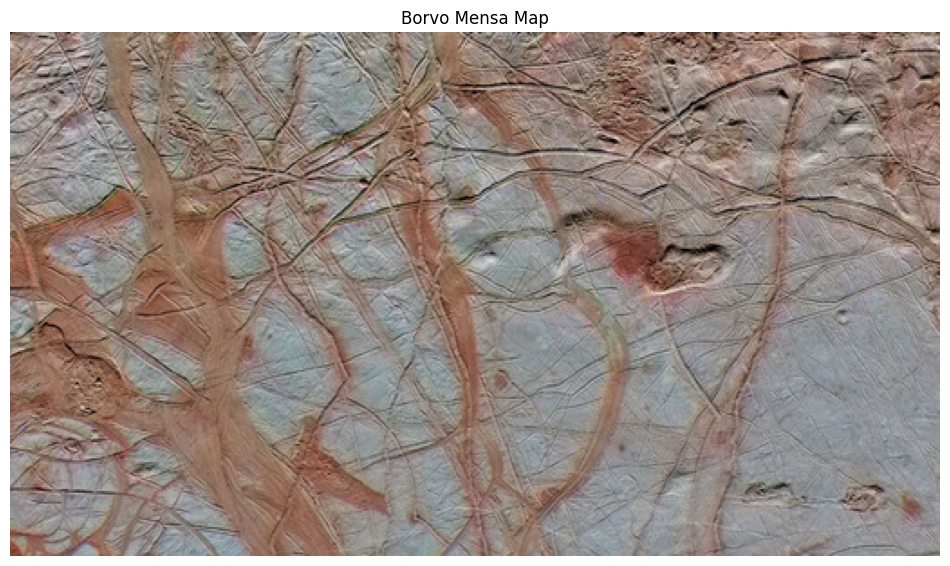

In [32]:
# Load image

# img_path = "/mnt/data/borvo_mensa.jpg"
img_path = r"europa_map\raw\resize_borvo_mensa.jpg"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
height, width, _ = img.shape

# Original Map
plt.figure(figsize=(12, 7))
plt.imshow(img_rgb)
plt.title("Borvo Mensa Map")
plt.axis('off')
plt.show

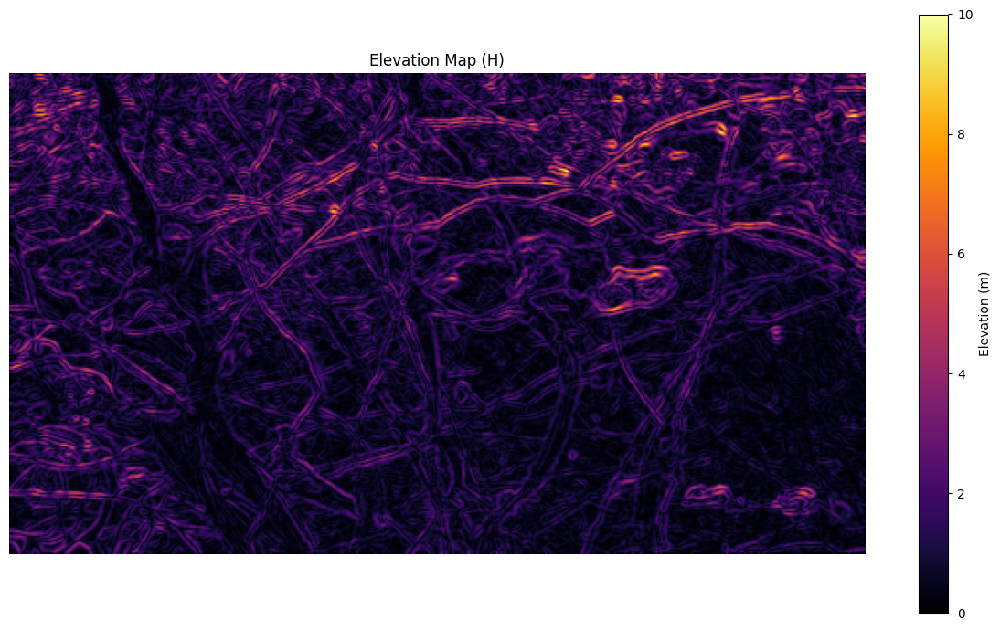

In [33]:
# Height (Elevation) Extraction

# Extract elevation (H) based on brightness
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# Gradient-based pseudo-height map
sobelx = cv2.Sobel(gray, cv2.CV_32F, 1, 0, ksize=5)
sobely = cv2.Sobel(gray, cv2.CV_32F, 0, 1, ksize=5)
magnitude = np.sqrt(sobelx**2 + sobely**2)
H_map = cv2.normalize(magnitude, None, 0, 10, cv2.NORM_MINMAX)

plt.figure(figsize=(12, 7))
plt.imshow(H_map, cmap="inferno")
plt.colorbar(label="Elevation (m)")
plt.title("Elevation Map (H)")
plt.axis("off")
plt.tight_layout()
plt.show()

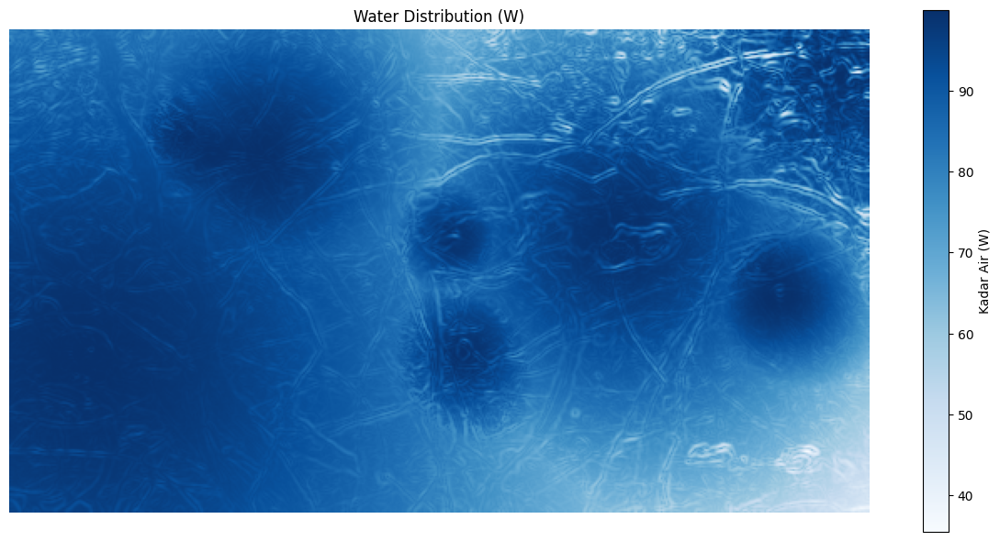

In [34]:
# Water sources
def pin_water(x, y, spread, H_factor):
    return (x, y, spread, H_factor)
def pin_water_pct(x_pct, y_pct, spread, H_factor):
    return (x_pct * width / 100, y_pct * height / 100, spread, H_factor)

waters = [
    pin_water_pct(71, 42, 180, 13), pin_water_pct(52.7, 67, 80, 10),
    pin_water_pct(8.4, 68, 350, 15), pin_water(530/2, 250/2, 60, 5),
    pin_water(911/2, 324/2, 70, 5), pin_water(922/2, 307/2, 70, 5),
    pin_water(928/2, 320/2, 70, 5), pin_water(909/2, 299/2, 70, 10),
    pin_water(298/2, 154/2, 150, 5), pin_water(211/2, 130/2, 70, 5),
    pin_water(285/2, 153/2, 100, 4), pin_water(273/2, 151/2, 75, 4),
    pin_water(261/2, 150/2, 90, 4), pin_water(249/2, 149/2, 90, 4),
    pin_water(237/2, 146/2, 90, 4), pin_water(993/2, 53/2, 180, 25),
    pin_water(919/2, 310/2, 80, 24)
]

# Spread water on the map
def pour_water(center, Hmap, max_val=100, sigma=100, H_factor=30):
    y_idx, x_idx = np.indices(Hmap.shape)
    distance = np.sqrt((x_idx - center[0])**2 + (y_idx - center[1])**2)
    real_distance = distance + H_factor * Hmap

    decay = max_val * np.exp(-(real_distance**2) / (2 * sigma**2))        # Gaussian decay
    return decay

# Rebuild water map dengan baseline 10
W_map = np.full((height, width), 10.0)
for cx, cy, sprd, h in waters:
    radial = pour_water((cx, cy), H_map, max_val=100, sigma=sprd, H_factor=h)
    W_map = np.maximum(W_map, radial)

# Center radially sharp, soft edge
# for cx, cy, sprd, *_ in waters:
#     cx, cy = int(cx), int(cy)
#     patch_radius = max(1, int(sprd // 10))
#     y_idx, x_idx = np.ogrid[-patch_radius:patch_radius+1, -patch_radius:patch_radius+1]
#     fade_sharp = patch_radius / 6
#     mask = np.exp(-(x_idx**2 + y_idx**2) / (2 * fade_sharp**2))
#     mask = 100 * (mask / mask.max())

#     y1, y2 = max(0, cy - patch_radius), min(height, cy + patch_radius + 1)
#     x1, x2 = max(0, cx - patch_radius), min(width, cx + patch_radius + 1)
#     my1, my2 = patch_radius - (cy - y1), patch_radius + (y2 - cy)
#     mx1, mx2 = patch_radius - (cx - x1), patch_radius + (x2 - cx)

#     W_map[y1:y2, x1:x2] = np.maximum(W_map[y1:y2, x1:x2], mask[my1:my2, mx1:mx2])

# Visualize water distribution map
plt.figure(figsize=(12, 6))
plt.imshow(W_map, cmap="Blues")
plt.colorbar(label="Kadar Air (W)")
plt.title("Water Distribution (W)")
plt.axis('off')
plt.tight_layout()
plt.show()


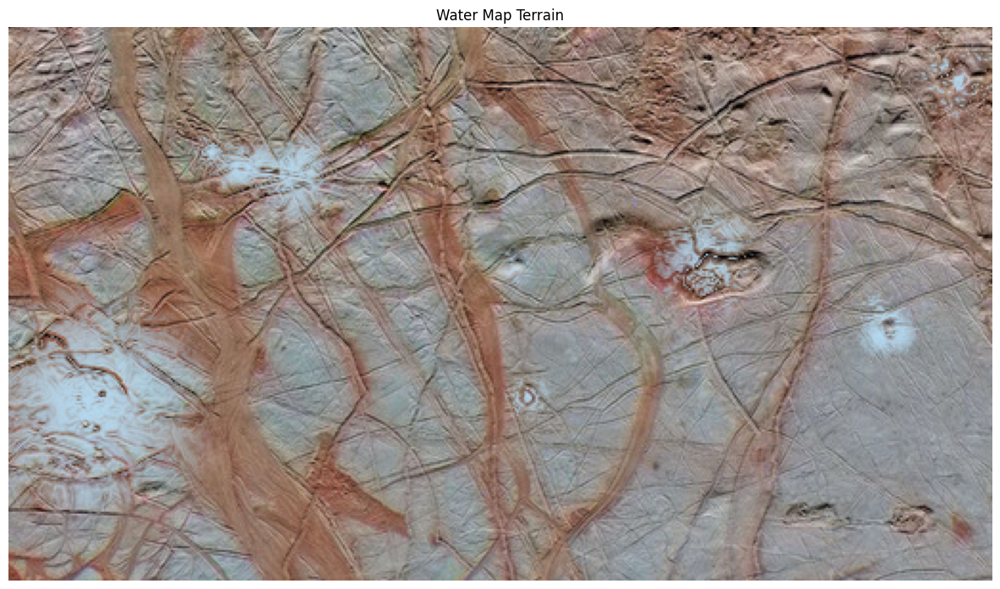

W_map max: 99.98502648380841


In [35]:
# Water Map Terrain

# Only W > 98 have alpha > 0 (displayed)
W_alpha = np.clip((W_map - 98) / 2, 0, 1)

# Blending to map
water_color = np.array([182, 219, 242]) / 255
blended = img_rgb / 255.0
for c in range(3):
    blended[:, :, c] = (1 - W_alpha) * blended[:, :, c] + W_alpha * water_color[c]

# Visualize watered map
plt.figure(figsize=(12, 7))
plt.imshow(blended)
plt.title("Water Map Terrain")
plt.axis('off')
plt.tight_layout()
plt.show()
# plt.savefig("first_waterMap.png", bbox_inches='tight', pad_inches=0, dpi=300)
print("W_map max:", np.max(W_map))



In [36]:
# Gabungkan jadi DataFrame
rows = []
for i in range(height):
    for j in range(width):
        h = H_map[i, j]
        w = W_map[i, j]  # pastikan W_map sudah dihitung sebelum ini
        rows.append([i, j, h, w])

df_HW = pd.DataFrame(rows, columns=["i", "j", "H", "W"])
df_HW.to_csv(r"dataset\resize_borvo.csv", index=False)


In [37]:
HFrame = pd.DataFrame(H_map)
HFrame

,0,1,2,3,4,5,6,7,8,9,...,505,506,507,508,509,510,511,512,513,514
0,0.000000,0.743651,0.296970,0.022089,0.166892,0.537490,0.586576,0.333784,0.819734,1.364587,...,0.571850,0.834460,0.751014,0.424593,1.698371,1.131429,1.381767,2.599097,1.430853,0.000000
1,3.085047,2.813801,2.345854,2.179965,1.987979,1.473394,0.690577,0.160883,1.027986,1.921974,...,3.651383,3.657498,3.514213,3.522058,3.202119,2.042286,2.036148,3.338173,4.150184,4.420183
2,1.808814,1.775875,1.849425,1.898206,1.614149,1.137926,0.919027,0.989536,0.712067,0.633467,...,3.441752,4.200215,4.661785,4.577985,3.867798,2.988965,2.703759,2.961157,3.211619,3.193036
3,1.553568,1.454666,1.224555,0.964409,1.024074,0.677034,1.123494,1.804656,2.159484,2.037663,...,1.164522,1.492156,1.996524,2.126876,2.024908,2.013721,1.753628,1.072968,0.824087,0.404958
4,3.239668,2.843951,1.897671,1.398221,1.478035,1.543875,1.931803,1.826944,1.704030,1.771770,...,1.450532,1.870687,1.553288,0.669986,0.244600,1.054640,1.792665,1.921341,1.889676,1.602654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,0.674931,0.832590,1.346406,2.422479,3.300734,2.658928,1.128633,0.484050,1.705924,1.570768,...,0.244969,0.359518,0.546266,0.814903,0.788537,0.662434,0.668240,0.851696,0.968120,0.962083
286,0.755922,0.836164,0.900925,1.485304,2.780569,3.227726,2.067734,1.030622,1.855311,1.284495,...,0.708677,1.050257,1.221904,1.627314,1.993785,2.046443,1.945444,1.948948,2.009739,2.019884
287,0.026997,0.096016,0.354495,0.879052,1.792221,2.967250,2.713892,1.345275,1.297907,0.611986,...,2.084481,2.078613,1.935930,2.109722,2.407384,2.558707,2.393545,2.067125,1.874595,1.835812
288,0.434410,0.502228,0.560292,0.409157,0.894833,2.215035,2.642536,1.280024,0.352826,0.793881,...,2.155725,1.923866,1.573201,1.429829,1.251099,1.039603,0.875459,0.564608,0.381944,0.353418


In [38]:
WFrame = pd.DataFrame(W_map)
WFrame

,0,1,2,3,4,5,6,7,8,9,...,505,506,507,508,509,510,511,512,513,514
0,84.673766,83.119757,84.106900,84.714239,84.438081,83.678613,83.600302,84.165116,83.149870,81.981961,...,97.298566,96.360681,96.609172,97.620661,92.360911,94.936624,93.734522,86.825613,93.309288,98.455721
1,77.927122,78.597428,79.714942,80.126459,80.593853,81.778735,83.517668,84.667278,82.840120,80.882190,...,80.615920,80.472973,81.413632,81.241611,83.401032,90.615590,90.542223,82.030038,75.758055,73.440986
2,81.022024,81.128268,80.994087,80.914801,81.582069,82.662605,83.166292,83.040241,83.664276,83.857225,...,82.407093,76.645856,72.872882,73.414546,78.816484,84.979651,86.726586,84.892566,83.015163,82.985480
3,81.739162,81.990493,82.528355,83.125052,83.024680,83.799927,82.864577,81.387682,80.615303,80.917491,...,95.583317,94.122392,91.546626,90.743811,91.204221,91.159742,92.423264,95.443029,96.316325,97.629984
4,78.022868,78.982828,81.179007,82.320364,82.174086,82.057599,81.221609,81.484397,81.785387,81.660917,...,94.540579,92.476902,93.937246,97.312198,98.446329,95.819356,92.396738,91.609899,91.655052,93.000912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,95.350498,95.187193,94.547116,93.041793,91.701293,92.763714,94.982035,95.822116,94.272945,94.492585,...,48.097564,47.407360,46.419392,45.100787,45.000949,45.310361,45.076426,44.115720,43.433518,43.248908
286,95.171306,95.105245,95.058149,94.312160,92.437759,91.764597,93.598017,95.062832,93.976347,94.794208,...,45.919134,44.309957,43.408234,41.578733,39.934475,39.531545,39.726685,39.514131,39.079410,38.841356
287,95.994133,95.946525,95.669740,95.043753,93.832049,92.086607,92.528494,94.563758,94.660964,95.575692,...,40.135233,39.963717,40.327137,39.452621,38.111210,37.343334,37.777809,38.833673,39.381020,39.332436
288,95.426538,95.377091,95.339028,95.561764,94.978710,93.159524,92.543694,94.568345,95.786473,95.269995,...,39.627074,40.339991,41.529034,41.901270,42.415863,43.064465,43.524093,44.583742,45.124109,45.031223


In [39]:
WFrame.describe()

,0,1,2,3,4,5,6,7,8,9,...,505,506,507,508,509,510,511,512,513,514
count,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,...,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000
mean,94.145186,93.991776,94.020120,94.001790,93.916699,93.881251,93.918455,94.023101,94.085207,94.110440,...,76.204548,75.545402,75.018864,74.598849,74.352725,74.116813,73.853446,73.324727,72.969845,73.586505
std,5.021584,5.083662,5.034020,5.078064,5.196289,5.286315,5.277328,5.142254,4.984731,4.942476,...,15.487618,15.527211,15.651477,15.597443,15.664933,15.959772,16.345557,16.329997,16.276131,16.513643
min,77.927122,78.597428,79.714942,77.928162,77.050323,76.873628,78.617362,79.378400,80.615303,80.882190,...,39.627074,39.963717,40.327137,39.452621,38.111210,37.343334,37.777809,38.833673,39.079410,38.841356
25%,91.446556,90.943653,90.792440,91.232306,91.317563,91.365338,91.485753,91.395312,91.266250,91.508393,...,61.650814,61.023764,60.732617,60.693577,60.743232,60.815571,60.726935,60.413058,59.855543,59.764246
50%,96.021012,95.932358,96.157361,96.130746,96.002783,96.162262,96.273776,96.039752,95.981594,96.012927,...,80.359529,79.114807,78.091435,77.398301,76.083150,75.069737,74.016586,73.410948,73.031728,73.531089
75%,97.992418,97.962116,97.860960,97.887306,97.843187,97.835847,97.773786,97.750001,97.842083,97.842939,...,88.041073,87.514574,87.812952,87.972335,87.436859,89.307963,90.190272,89.211472,88.533878,89.599332
max,99.207570,99.221140,99.244073,99.331207,99.292979,99.303406,99.321725,99.338783,99.395932,99.470727,...,99.394887,99.678910,99.426301,99.323514,99.234847,98.990629,99.207202,99.124413,99.022558,99.256093


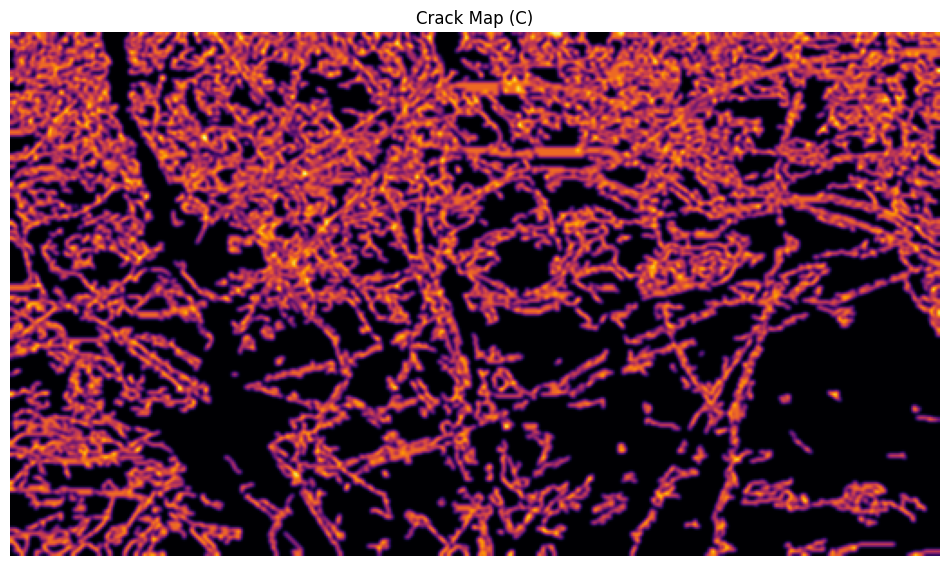

In [40]:
# Extract Ice Cracks

# Grayscale image
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Crack map (C_map) -> Celah es
edges = cv2.Canny(gray, 100, 200)
C_blurred = cv2.GaussianBlur(edges.astype(np.float32), (5, 5), 0)
C_map = np.clip(C_blurred / C_blurred.max(), 0, 1)

# Crack Detection (Canny for cracks/celestial fissures)
edges = cv2.Canny(gray, threshold1=100, threshold2=200)

# Convert to crack severity (C_map)
blurred = cv2.GaussianBlur(edges.astype(np.float32), (5, 5), 0)
C_map = blurred / blurred.max()  # normalize to 0–1
C_map = np.clip(C_map, 0, 1)

# Plot
plt.figure(figsize=(12, 7))
plt.imshow(C_map, cmap='inferno')
plt.title("Crack Map (C)")
plt.axis('off')
plt.show()


<function matplotlib.pyplot.show(close=None, block=None)>

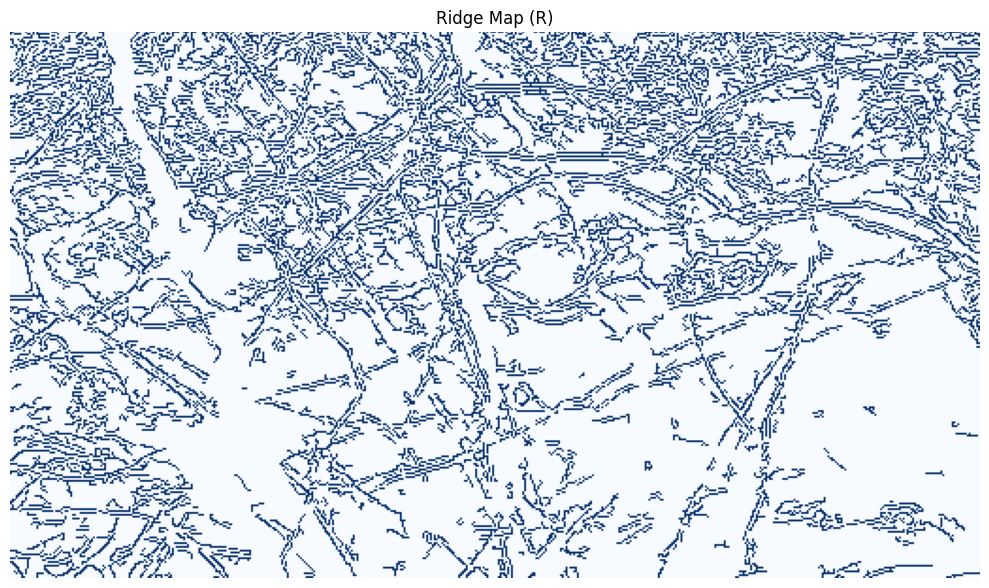

In [41]:
# Extract Ridges

# Resistance map (R_map) -> Ridges
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)
R_gradient = np.sqrt(sobelx**2 + sobely**2)
R_map = R_gradient / R_gradient.max()

resist_map = (R_map > 0.4).astype(np.uint8)
laplacian = cv2.Laplacian(gray, cv2.CV_64F)
resist_map = (np.abs(laplacian) > 45).astype(np.uint8)

edges = cv2.Canny(gray, 100, 200)
resist_map = (edges > 0).astype(np.uint8)
plt.figure(figsize=(10, 7))
plt.imshow(resist_map, cmap='Blues')
plt.title("Ridge Map (R)")
plt.axis('off')
plt.tight_layout()
plt.show

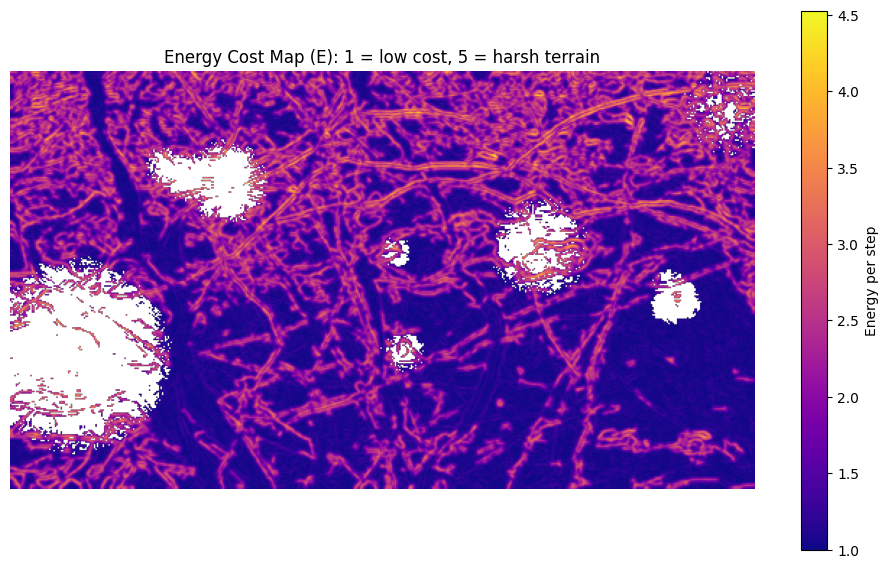

In [42]:
# Energy Consumption Map

# Compute E_map
E_map = 1 + 2 * R_map + 2 * C_map

E_map[W_map > 98] = np.nan  # block water areas
E_map = np.clip(E_map, 1, 5)

# Visualize E_map
plt.figure(figsize=(12, 7))
plt.imshow(E_map, cmap='plasma')
plt.title("Energy Cost Map (E): 1 = low cost, 5 = harsh terrain")
plt.colorbar(label='Energy per step')
plt.axis('off')
plt.show()


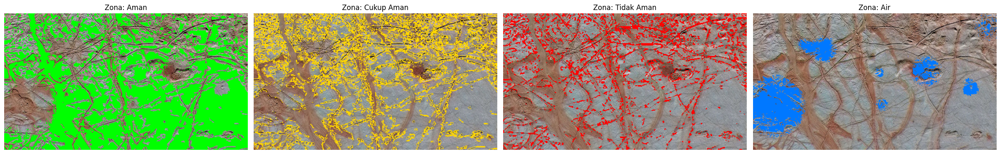

In [43]:
# Zone Map (Z)

Z_map = np.full((height, width), -1, dtype=int)

# Zona Air (kode: 3)
Z_map[W_map > 98] = 3

# Aman (kode: 0)
mask_aman = np.logical_and.reduce((
    W_map <= 98,
    R_map <= 0.35,
    C_map <= 0.3
))
Z_map[mask_aman] = 0

# Tidak Aman (kode: 2)
mask_bahaya = np.logical_and.reduce((
    W_map <= 98,
    np.logical_or(R_map > 0.6, C_map > 0.55)
))
Z_map[mask_bahaya] = 2

# Cukup Aman (kode: 1)
mask_cukup = np.logical_and.reduce((
    W_map <= 98,
    Z_map == -1  # semua yang belum terisi dan bukan zona air/bahaya
))
Z_map[mask_cukup] = 1

# Visualize Z_map
Z_labels = ['Aman', 'Cukup Aman', 'Tidak Aman', 'Air']
Z_colors = [
    [0, 255, 0],
    [255, 215, 0],
    [255, 0, 0],
    [0, 120, 255]
]

fig, axes = plt.subplots(1, 4, figsize=(24, 6))
for z in range(4):
    Z_overlay = img_rgb.copy()
    mask = (Z_map == z)
    for c in range(3):
        Z_overlay[:, :, c] = np.where(mask, Z_colors[z][c], img_rgb[:, :, c])
    axes[z].imshow(Z_overlay)
    axes[z].set_title(f"Zona: {Z_labels[z]}")
    axes[z].axis('off')

plt.tight_layout()
plt.show()


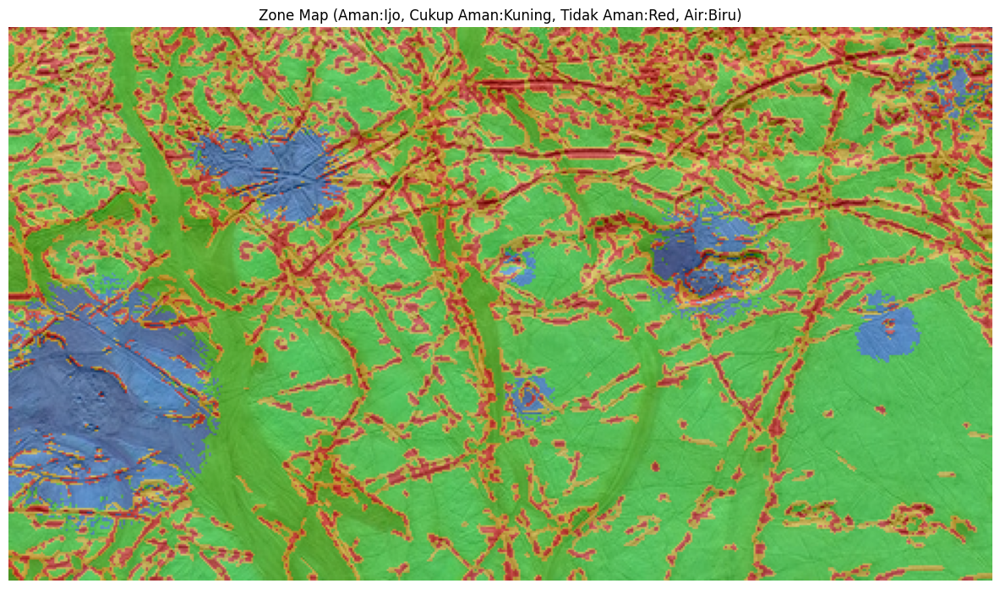

In [44]:
overlay_clr = {
    0: (0, 255, 0),      # Aman → Hijau
    1: (255, 215, 0),    # Cukup Aman → Kuning emas
    2: (255, 0, 0),      # Tidak Aman → Merah
    3: (0, 120, 255)     # Air → Biru terang
}

Z_mix = img_rgb.copy()
alpha = 0.4  # transparansi

# Terapkan overlay untuk setiap zona
for z, color in overlay_clr.items():
    mask = (Z_map == z)
    Z_layer = np.ones_like(img_rgb, dtype=np.uint8) * np.array(color, dtype=np.uint8)
    Z_mix[mask] = (
        alpha * Z_layer[mask] + (1 - alpha) * img_rgb[mask]
    ).astype(np.uint8)

# Tampilkan hasil gabungan
plt.figure(figsize=(12, 7))
plt.imshow(Z_mix)
plt.title("Zone Map (Aman:Ijo, Cukup Aman:Kuning, Tidak Aman:Red, Air:Biru)")
plt.axis('off')
plt.tight_layout()
plt.show()


In [45]:
ZFrame = pd.DataFrame(Z_map)
CFrame = pd.DataFrame(C_map)
RFrame = pd.DataFrame(R_map)
EFrame = pd.DataFrame(E_map)

ZFrame

,0,1,2,3,4,5,6,7,8,9,...,505,506,507,508,509,510,511,512,513,514
0,2,2,2,2,2,1,0,0,1,2,...,2,2,2,1,2,2,2,2,2,3
1,2,2,1,2,1,1,0,0,1,2,...,2,2,2,2,2,2,2,2,2,2
2,1,1,1,1,1,0,0,1,1,2,...,2,2,2,2,2,2,2,1,2,2
3,1,1,0,0,0,1,1,1,1,2,...,1,1,1,1,1,1,1,1,1,1
4,2,1,0,0,1,1,2,2,1,1,...,1,1,1,0,3,1,2,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,0,0,1,2,2,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
286,0,0,1,2,2,2,1,1,1,1,...,0,0,1,1,1,1,1,1,1,1
287,0,0,0,1,2,2,2,1,1,0,...,1,1,1,1,1,1,1,1,1,1
288,0,0,0,0,1,1,2,2,1,0,...,1,1,1,1,1,1,1,1,1,1


In [46]:
CFrame

,0,1,2,3,4,5,6,7,8,9,...,505,506,507,508,509,510,511,512,513,514
0,0.774869,0.722513,0.659686,0.659686,0.628272,0.460733,0.240838,0.209424,0.397906,0.554974,...,0.701571,0.701571,0.596859,0.534031,0.575916,0.586387,0.617801,0.743455,0.806283,0.795812
1,0.586387,0.560209,0.544503,0.570681,0.549738,0.408377,0.230366,0.214660,0.387435,0.554974,...,0.706806,0.727749,0.659686,0.623037,0.659686,0.643979,0.617801,0.675393,0.738220,0.753927
2,0.314136,0.303665,0.308901,0.345550,0.350785,0.293194,0.251309,0.314136,0.455497,0.596859,...,0.628272,0.633508,0.628272,0.633508,0.659686,0.638743,0.570681,0.528796,0.554974,0.586387
3,0.376963,0.314136,0.209424,0.193717,0.251309,0.314136,0.403141,0.497382,0.549738,0.607330,...,0.476440,0.413613,0.403141,0.392670,0.418848,0.497382,0.544503,0.502618,0.439791,0.418848
4,0.649215,0.528796,0.293194,0.204188,0.324607,0.507853,0.638743,0.623037,0.518325,0.523560,...,0.497382,0.429319,0.366492,0.282723,0.298429,0.476440,0.643979,0.633508,0.502618,0.429319
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,0.052356,0.136126,0.356021,0.612565,0.701571,0.502618,0.267016,0.303665,0.455497,0.387435,...,0.026178,0.057592,0.078534,0.083770,0.083770,0.083770,0.083770,0.083770,0.083770,0.083770
286,0.062827,0.151832,0.350785,0.565445,0.717277,0.675393,0.497382,0.455497,0.486911,0.324607,...,0.162304,0.256545,0.319372,0.335079,0.335079,0.335079,0.335079,0.335079,0.335079,0.335079
287,0.041885,0.115183,0.277487,0.429319,0.570681,0.685864,0.659686,0.544503,0.424084,0.235602,...,0.387435,0.450262,0.492147,0.502618,0.502618,0.502618,0.502618,0.502618,0.502618,0.502618
288,0.010471,0.041885,0.120419,0.193717,0.303665,0.534031,0.691099,0.570681,0.319372,0.125654,...,0.507853,0.413613,0.350785,0.335079,0.335079,0.335079,0.335079,0.335079,0.335079,0.335079


In [47]:
RFrame

,0,1,2,3,4,5,6,7,8,9,...,505,506,507,508,509,510,511,512,513,514
0,0.000000,0.074365,0.029697,0.002209,0.016689,0.053749,0.058658,0.033378,0.081973,0.136459,...,0.057185,0.083446,0.075101,0.042459,0.169837,0.113143,0.138177,0.259910,0.143085,0.000000
1,0.308505,0.281380,0.234585,0.217997,0.198798,0.147339,0.069058,0.016088,0.102799,0.192197,...,0.365138,0.365750,0.351421,0.352206,0.320212,0.204229,0.203615,0.333817,0.415018,0.442018
2,0.180881,0.177588,0.184942,0.189821,0.161415,0.113793,0.091903,0.098954,0.071207,0.063347,...,0.344175,0.420022,0.466179,0.457799,0.386780,0.298896,0.270376,0.296116,0.321162,0.319304
3,0.155357,0.145467,0.122455,0.096441,0.102407,0.067703,0.112349,0.180466,0.215948,0.203766,...,0.116452,0.149216,0.199652,0.212688,0.202491,0.201372,0.175363,0.107297,0.082409,0.040496
4,0.323967,0.284395,0.189767,0.139822,0.147804,0.154388,0.193180,0.182694,0.170403,0.177177,...,0.145053,0.187069,0.155329,0.066999,0.024460,0.105464,0.179266,0.192134,0.188968,0.160265
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,0.067493,0.083259,0.134641,0.242248,0.330073,0.265893,0.112863,0.048405,0.170592,0.157077,...,0.024497,0.035952,0.054627,0.081490,0.078854,0.066243,0.066824,0.085170,0.096812,0.096208
286,0.075592,0.083616,0.090092,0.148530,0.278057,0.322773,0.206773,0.103062,0.185531,0.128450,...,0.070868,0.105026,0.122190,0.162731,0.199378,0.204644,0.194544,0.194895,0.200974,0.201988
287,0.002700,0.009602,0.035449,0.087905,0.179222,0.296725,0.271389,0.134528,0.129791,0.061199,...,0.208448,0.207861,0.193593,0.210972,0.240738,0.255871,0.239355,0.206713,0.187460,0.183581
288,0.043441,0.050223,0.056029,0.040916,0.089483,0.221504,0.264254,0.128002,0.035283,0.079388,...,0.215573,0.192387,0.157320,0.142983,0.125110,0.103960,0.087546,0.056461,0.038194,0.035342


In [48]:
EFrame

,0,1,2,3,4,5,6,7,8,9,...,505,506,507,508,509,510,511,512,513,514
0,2.549738,2.593756,2.378766,2.323789,2.289923,2.028964,1.598991,1.485605,1.959758,2.382865,...,2.517511,2.570033,2.343920,2.152981,2.491507,2.399061,2.511956,3.006730,2.898736,NaN
1,2.789784,2.683179,2.558176,2.577354,2.497072,2.111433,1.598848,1.461496,1.980466,2.494343,...,3.143889,3.186997,3.022214,2.950485,2.959795,2.696415,2.642832,3.018420,3.306477,3.391890
2,1.990035,1.962505,1.987686,2.070741,2.024401,1.813973,1.686423,1.826179,2.053408,2.320411,...,2.944895,3.107059,3.188901,3.182613,3.092931,2.875280,2.682113,2.649823,2.752272,2.811382
3,2.064640,1.919206,1.663759,1.580316,1.707433,1.763679,2.030982,2.355696,2.531373,2.622192,...,2.185784,2.125656,2.205587,2.210716,2.242678,2.397509,2.439731,2.219829,2.044399,1.918688
4,2.946363,2.626382,1.965922,1.688021,1.944822,2.324482,2.663847,2.611462,2.377455,2.401475,...,2.284871,2.232776,2.043642,1.699442,NaN,2.163808,2.646491,2.651284,2.383171,2.179170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,1.239698,1.438769,1.981323,2.709627,3.063288,2.537021,1.759758,1.704140,2.252180,2.089023,...,1.101350,1.187087,1.266321,1.330520,1.325247,1.300026,1.301187,1.337879,1.361163,1.359956
286,1.276839,1.470898,1.881756,2.427951,2.990669,2.996331,2.408311,2.117119,2.344884,1.906114,...,1.466343,1.723140,1.883124,1.995620,2.068914,2.079446,2.059246,2.059947,2.072105,2.074134
287,1.089169,1.249570,1.625873,2.034449,2.499805,2.965178,2.862150,2.358060,2.107749,1.593601,...,2.191765,2.316246,2.371479,2.427180,2.486712,2.516977,2.483945,2.418661,2.380155,2.372398
288,1.107824,1.184215,1.352896,1.469266,1.786296,2.511070,2.910706,2.397366,1.709309,1.410085,...,2.446852,2.211998,2.016211,1.956123,1.920377,1.878078,1.845249,1.783079,1.746546,1.740841
